# Example: Synthetic module EL IV
This example shows how to build synthetic module EL IVs using single cell SDM parameters

In [ ]:
import os
from pathlib import Path

project_root = Path.cwd().parents[1]
os.chdir(project_root)  # now cwd is .../pvcracks

from pvcracks.pvspice_lite.pvspice_tools import run_ngspice
from pvcracks.pvspice_lite.pvspice_tools import ngpsice_read_voltage_current_modules

from pvcracks.pvspice_lite.pvspice_tools import create_cell_netcode
from pvcracks.pvspice_lite.pvspice_tools import minimod_spice

from pvcracks.pvspice_lite.pvspice_helper import read_IV
from pvcracks.pvspice_lite.pvspice_helper import read_EL
from pvcracks.pvspice_lite.pvspice_helper import cells2Mod
from pvcracks.pvspice_lite.pvspice_helper import extract_params


import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import pvlib
import scipy

## Install ngspice
Install ngspice with conda:
- conda install ngspice
Find path (e.g. "/home//.conda/envs/pyhpc_spice/bin/ngspice")
Edit the spicepath below to be that path

In [2]:
# spicepath = <your spice path>
# spicepath = '/home/bkbyfor/anaconda3/envs/Things/bin/ngspice'
spicepath = "/home/nrjost/.conda/envs/pyhpc_spice/bin/ngspice"

## Read Data

In [ ]:
# Master DataFrame
Cell9Master = pd.read_csv("docs/data/ELdata_module_209.csv", index_col=0)
# 3x3 minimodule IVs
FM_Init = read_IV("docs/data/Minimodule_IVs/209_s0_FM_1000.csv")
FM_Deg1 = read_IV("docs/data/Minimodule_IVs/209_s1_FM_1000.csv")
FM_Deg2 = read_IV("docs/data/Minimodule_IVs/209_s2_FM_1000.csv")

In [4]:
Cell9Master.head()

,ELPath,Module,Deg,Rs,Rsh,I,Is,N,Pmp,Vmp,Imp
0,/docs/data/EL/209_A3/Init/209_A3_0005_2021_04_...,209_A3,Init,0.008625,525.0,8.242323,6.545686e-08,1.292650,3.564256,0.465455,7.657580
1,/docs/data/EL/209_C1/Init/209_C1_0005_2021_04_...,209_C1,Init,0.009957,1543.5,8.201203,3.488834e-08,1.267408,3.547602,0.465455,7.621802
2,/docs/data/EL/209_A2/Init/209_A2_0005_2021_04_...,209_A2,Init,0.008988,1380.5,8.223689,6.476966e-08,1.293979,3.543461,0.465455,7.612904
3,/docs/data/EL/209_A1/Init/209_A1_0005_2021_04_...,209_A1,Init,0.009377,1789.5,8.185086,3.607070e-08,1.254117,3.524153,0.465455,7.571422
4,/docs/data/EL/209_C2/Init/209_C2_0005_2021_04_...,209_C2,Init,0.009753,1723.0,8.122330,2.261230e-08,1.224717,3.494077,0.465455,7.506806


Cell9Master description
 
    ElPath : Path to the EL image of the cell
    Module : Name of the cell
    Deg    : Degredation step of Mini Module 


SDM params found through fitting of the measured cell IVs
    
    Rs  : Series Resistance 
    Rsh : Shunt Resistance
    I   : Current 
    Is  : Dark Current 
    N   : Diode Ideality Factor


## Display Single Cell Fits

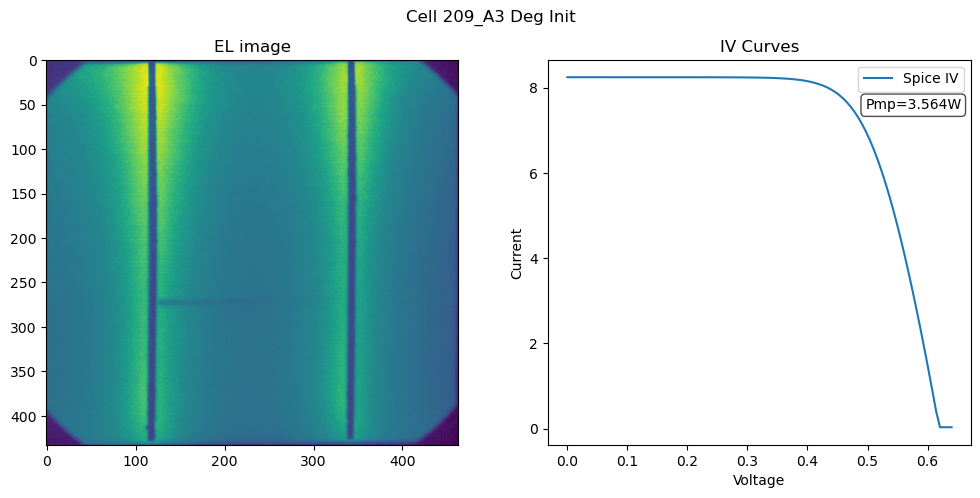

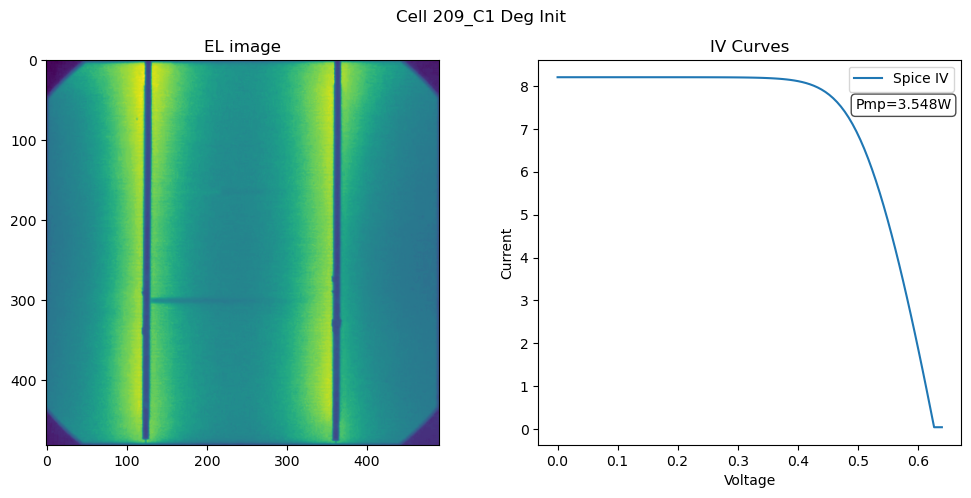

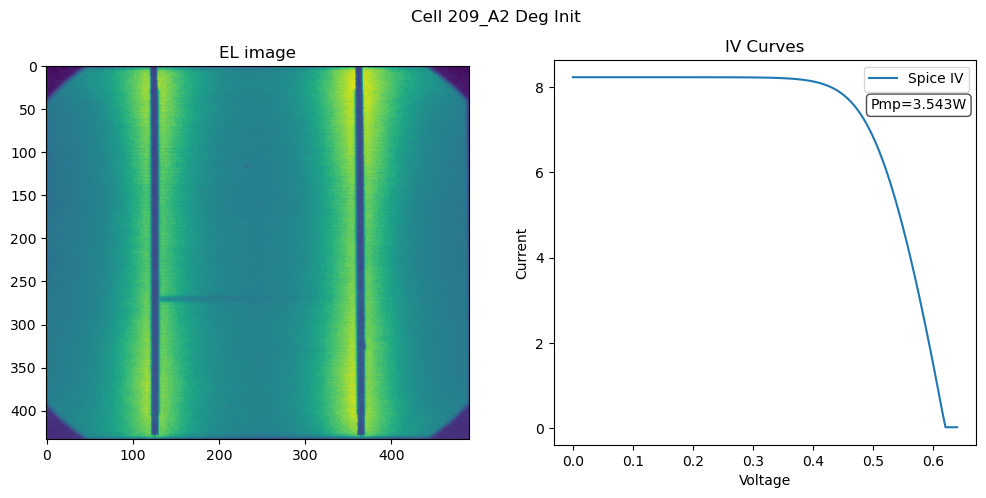

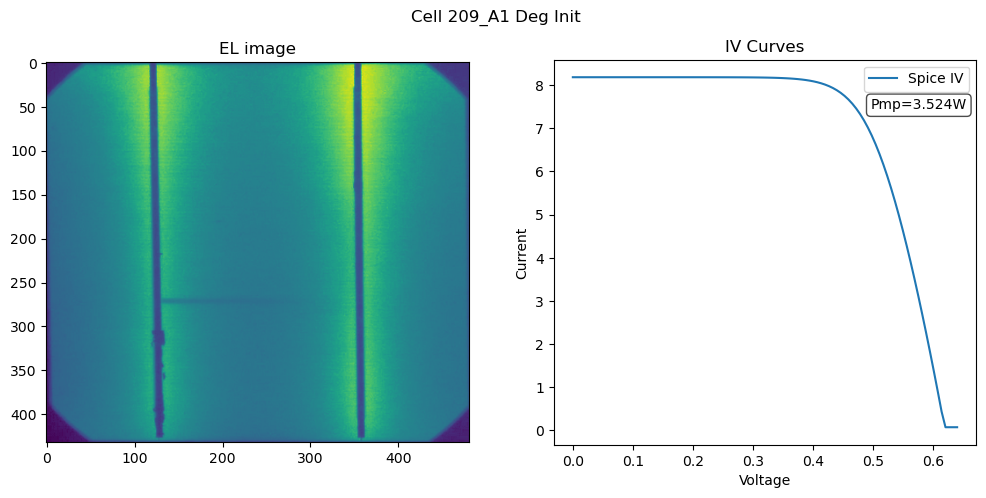

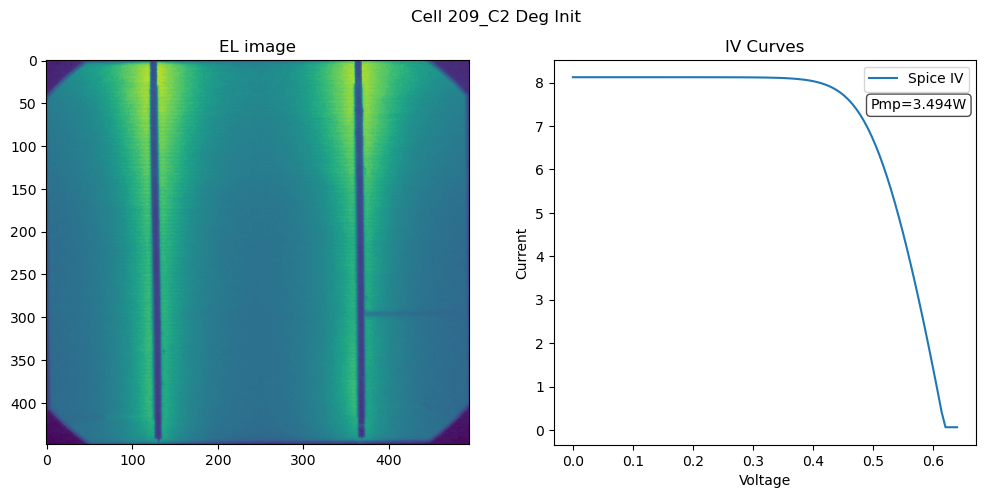

...

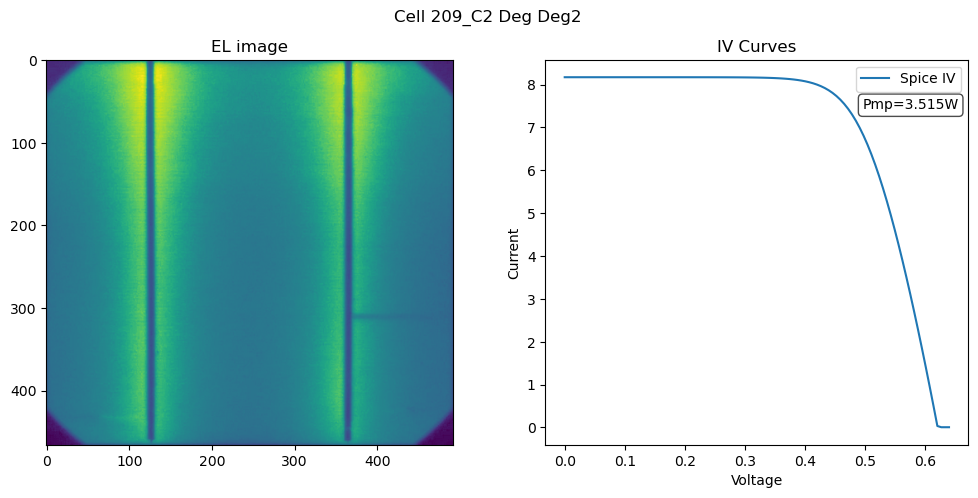

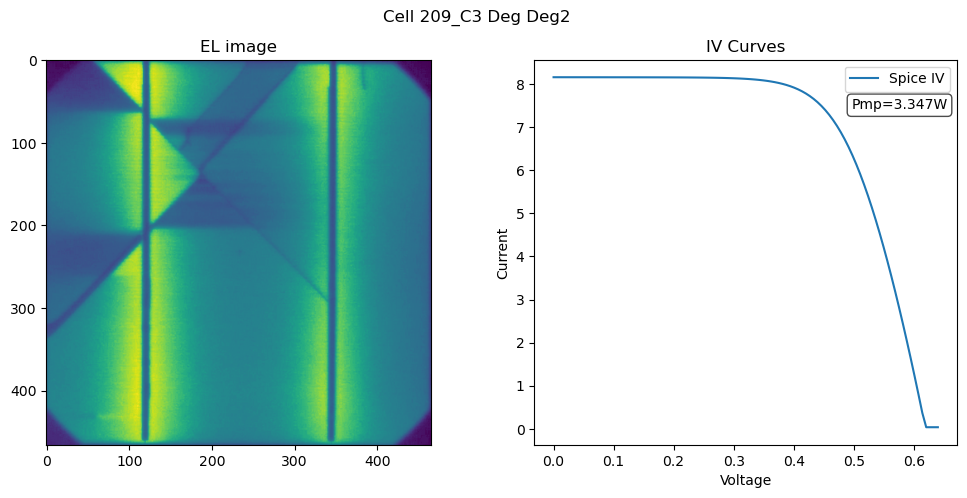

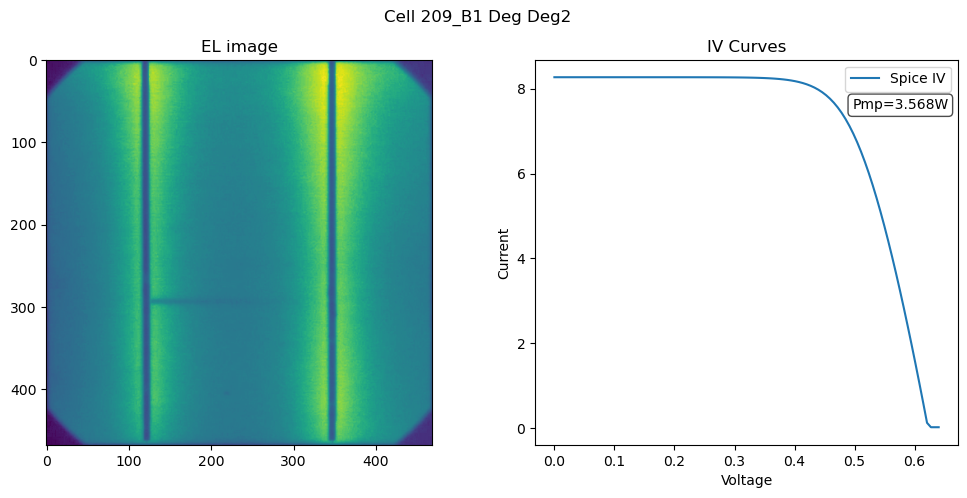

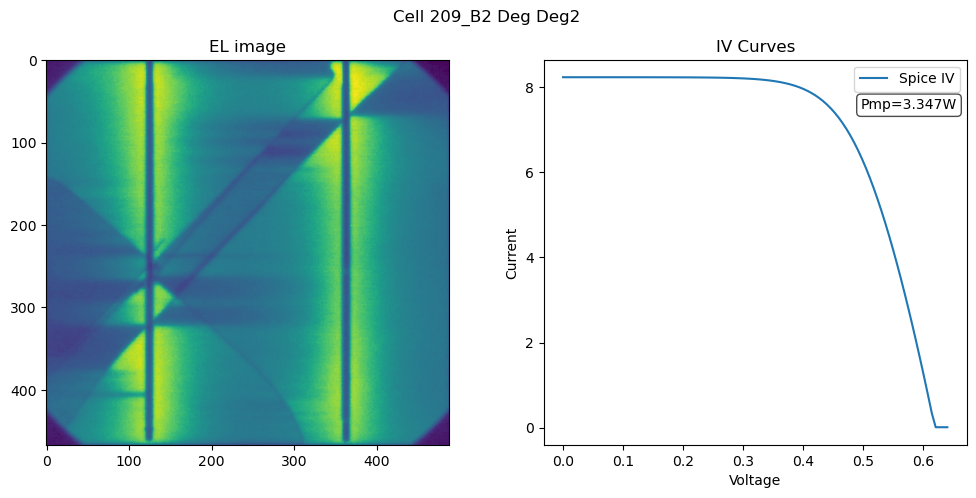

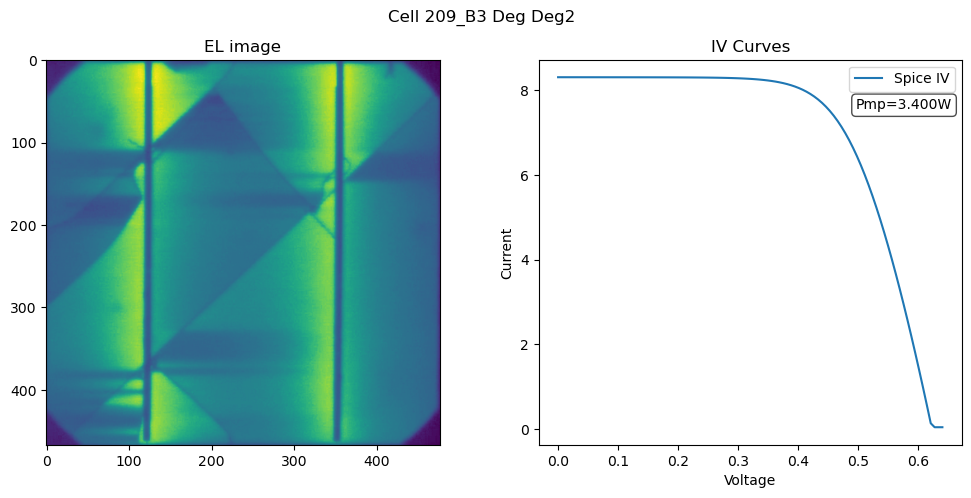

In [ ]:
# iterate over the dataframe to display each entry
for ind, row in Cell9Master.iterrows():
    # File Path for writing Spice files
    file_path = f"{os.getcwd()}/pvcracks/pvspice_lite/"
    # Read image
    img = read_EL(f"{os.getcwd()}{row.ELPath}")
    # Order SDM params in the passed DataFrame into a list of dictionary for minimod_spice
    Params = extract_params(Cell9Master.loc[ind:ind])
    # Voltage points for Spice simulation
    V = np.linspace(0, 0.64, 100)
    # Spice simulation for series connected SDM cells
    IV_Pred = minimod_spice(
        Params, file_path, V, V_Step=0.001, file_name="", spicepath=spicepath
    )

    # Calculate maximum power point values
    V_sim = IV_Pred[0]
    I_sim = IV_Pred[1]
    P = V_sim * I_sim
    idx_mpp = np.argmax(P)
    Pmp = P[idx_mpp]

    # Plot Findings
    fig, axs = plt.subplots(1, 2, figsize=(12, 5))
    fig.suptitle(f"Cell {row.Module} Deg {row.Deg}")
    axs[0].imshow(img)
    axs[0].set_title("EL image")
    axs[1].plot(IV_Pred[0], IV_Pred[1], label="Spice IV")
    axs[1].text(
        0.75,
        0.90,
        f"Pmp={Pmp:.3f}W",
        transform=axs[1].transAxes,
        fontsize=10,
        verticalalignment="top",
        bbox=dict(boxstyle="round", facecolor="white", alpha=0.7),
    )
    axs[1].set_xlabel("Voltage")
    axs[1].set_ylabel("Current")
    axs[1].set_title("IV Curves")
    axs[1].legend()

    plt.show()

# Simulate 3x3 MiniMod

## Initial

In [ ]:
# query the slice of initial readings sorted by the Module name
Init_Cells = Cell9Master.loc[Cell9Master.Deg == "Init"].sort_values(by=["Module"])

Text(0.5, 0, 'Sample')

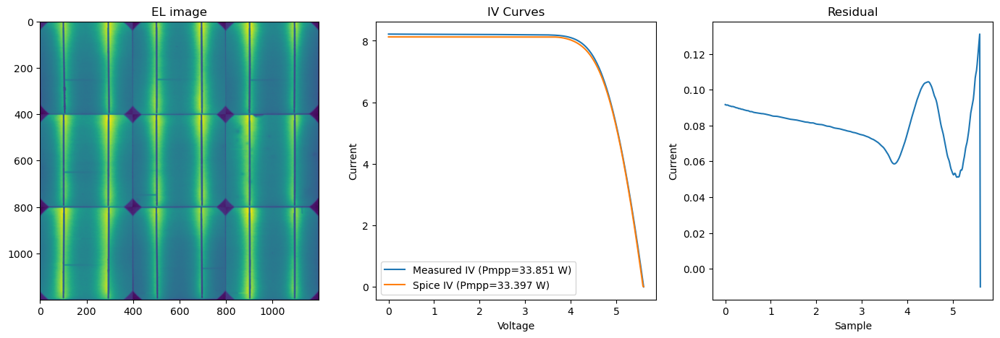

In [ ]:
# File Path for writing Spice files
file_path = f"{os.getcwd()}/pvcracks/pvspice_lite/"
# Construct Image for cells into module
MMEL = cells2Mod(Init_Cells, (400, 400), 3, 3)
# Order SDM params in the passed DataFrame into a list of dictionary for minimod_spice
Params = extract_params(Init_Cells)
# Spice simulation for series connected SDM cells
IV_Pred = minimod_spice(
    Params, file_path, FM_Init[0], V_Step=0.001, file_name="", spicepath=spicepath
)
# unpack measured vs. predicted
V_meas, I_meas = FM_Init
V_sp, I_sp = IV_Pred
# compute Power curves
P_meas = V_meas * I_meas
P_sp = V_sp * I_sp
# locate maximum‐power indices
idx_meas = np.argmax(P_meas)
idx_sp = np.argmax(P_sp)
# extract MPPs
Pmp_meas = P_meas[idx_meas]
Pmp_sp = P_sp[idx_sp]
# Plot Findigs
fig, axs = plt.subplots(1, 3, figsize=(17, 5))
axs[0].imshow(MMEL)
axs[0].set_title("EL image")
axs[1].plot(V_meas, I_meas, label=f"Measured IV (Pmpp={Pmp_meas:.3f} W)")
axs[1].plot(V_sp, I_sp, label=f"Spice IV (Pmpp={Pmp_sp:.3f} W)")
axs[1].set_xlabel("Voltage")
axs[1].set_ylabel("Current")
axs[1].set_title("IV Curves")
axs[1].legend()
axs[2].set_title("Residual")
axs[2].plot(FM_Init[0], FM_Init[1] - IV_Pred[1])
axs[2].set_ylabel("Current")
axs[2].set_xlabel("Sample")

## Deg1 

In [ ]:
# query the slice of Deg 1 readings sorted by the Module name
Deg1_Cells = Cell9Master.loc[Cell9Master.Deg == "Deg1"].sort_values(by=["Module"])

Text(0.5, 0, 'Sample')

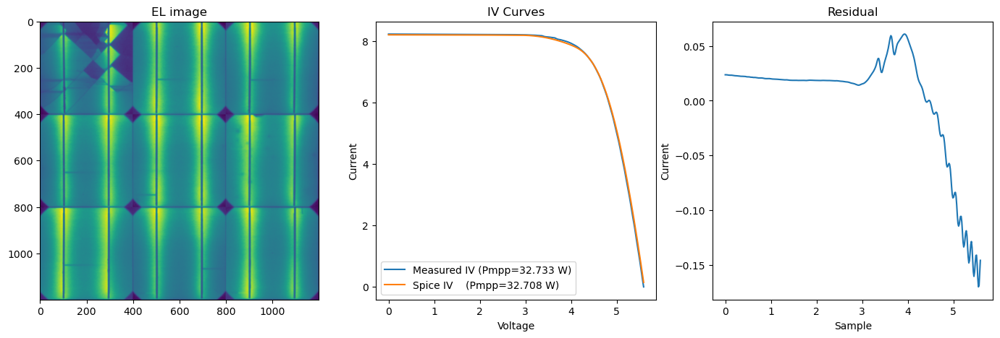

In [ ]:
# File Path for writing Spice files
file_path = f"{os.getcwd()}/pvcracks/pvspice_lite/"
# Construct Image for cells into module
MMEL = cells2Mod(Deg1_Cells, (400, 400), 3, 3)
# Order SDM params in the passed DataFrame into a list of dictionary for minimod_spice
Params = extract_params(Deg1_Cells)
# Spice simulation for series connected SDM cells
IV_Pred = minimod_spice(
    Params, file_path, FM_Deg1[0], V_Step=0.001, file_name="", spicepath=spicepath
)
# unpack measured vs. predicted
V_meas, I_meas = FM_Deg1
V_sp, I_sp = IV_Pred
# compute Power curves
P_meas = V_meas * I_meas
P_sp = V_sp * I_sp
# locate maximum‐power indices
idx_meas = np.argmax(P_meas)
idx_sp = np.argmax(P_sp)
# extract MPPs
Pmp_meas = P_meas[idx_meas]
Pmp_sp = P_sp[idx_sp]
# Plot Findigs
fig, axs = plt.subplots(1, 3, figsize=(17, 5))
axs[0].imshow(MMEL)
axs[0].set_title("EL image")
axs[1].plot(V_meas, I_meas, label=f"Measured IV (Pmpp={Pmp_meas:.3f} W)")
axs[1].plot(V_sp, I_sp, label=f"Spice IV    (Pmpp={Pmp_sp:.3f} W)")
axs[1].set_xlabel("Voltage")
axs[1].set_ylabel("Current")
axs[1].set_title("IV Curves")
axs[1].legend()
axs[2].set_title("Residual")
axs[2].plot(FM_Deg1[0], FM_Deg1[1] - IV_Pred[1])
axs[2].set_ylabel("Current")
axs[2].set_xlabel("Sample")

## Deg 2

In [ ]:
# query the slice of Deg 2 readings sorted by the Module name
Deg2_Cells = Cell9Master.loc[Cell9Master.Deg == "Deg2"].sort_values(by=["Module"])

Text(0.5, 0, 'Sample')

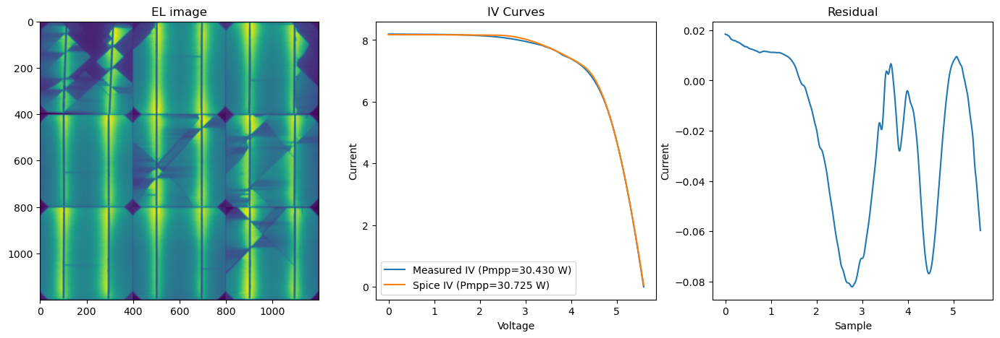

In [ ]:
# File Path for writing Spice files
file_path = f"{os.getcwd()}/pvcracks/pvspice_lite/"
# Construct Image for cells into module
MMEL = cells2Mod(Deg2_Cells, (400, 400), 3, 3)
# Order SDM params in the passed DataFrame into a list of dictionary for minimod_spice
Params = extract_params(Deg2_Cells)
# Spice simulation for series connected SDM cells
IV_Pred = minimod_spice(
    Params, file_path, FM_Deg2[0], V_Step=0.001, file_name="", spicepath=spicepath
)
# unpack measured vs. predicted
V_meas, I_meas = FM_Deg2
V_sp, I_sp = IV_Pred
# compute Power curves
P_meas = V_meas * I_meas
P_sp = V_sp * I_sp
# locate maximum‐power indices
idx_meas = np.argmax(P_meas)
idx_sp = np.argmax(P_sp)
# extract MPPs
Pmp_meas = P_meas[idx_meas]
Pmp_sp = P_sp[idx_sp]
# Plot Findigs
fig, axs = plt.subplots(1, 3, figsize=(17, 5))
axs[0].imshow(MMEL)
axs[0].set_title("EL image")
axs[1].plot(V_meas, I_meas, label=f"Measured IV (Pmpp={Pmp_meas:.3f} W)")
axs[1].plot(V_sp, I_sp, label=f"Spice IV (Pmpp={Pmp_sp:.3f} W)")
axs[1].set_xlabel("Voltage")
axs[1].set_ylabel("Current")
axs[1].set_title("IV Curves")
axs[1].legend()
axs[2].set_title("Residual")
axs[2].plot(FM_Deg2[0], FM_Deg2[1] - IV_Pred[1])
axs[2].set_ylabel("Current")
axs[2].set_xlabel("Sample")

# Constructing Synthetic MiniModule Data 

#### Example for 2x2 minimodules to show capability

In [ ]:
# Randomly select 4 init cells and combine them into a single dataframe
Synth_MiniMod_Init = Init_Cells.sample(n=4)
# Select the damaged cell (top left corner) in Deg1 and repeat it 4 times
Synth_MiniMod_Deg1 = Deg1_Cells.loc[[12, 12, 12, 12]]
# Select the damaged cell (top left corner) in Deg2 and repeat it 4 times
Synth_MiniMod_Deg2 = Deg2_Cells.loc[[21, 21, 21, 21]]
# Mix 2 initial cells and the most damaged cell in Deg2
Synth_MiniMod_Mix = pd.concat((Deg2_Cells.loc[[21, 21]], Init_Cells.sample(n=2)))

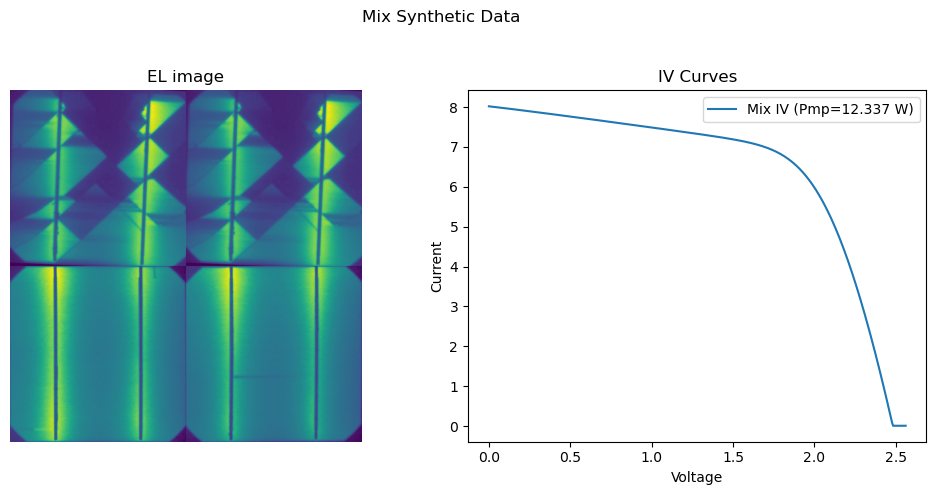

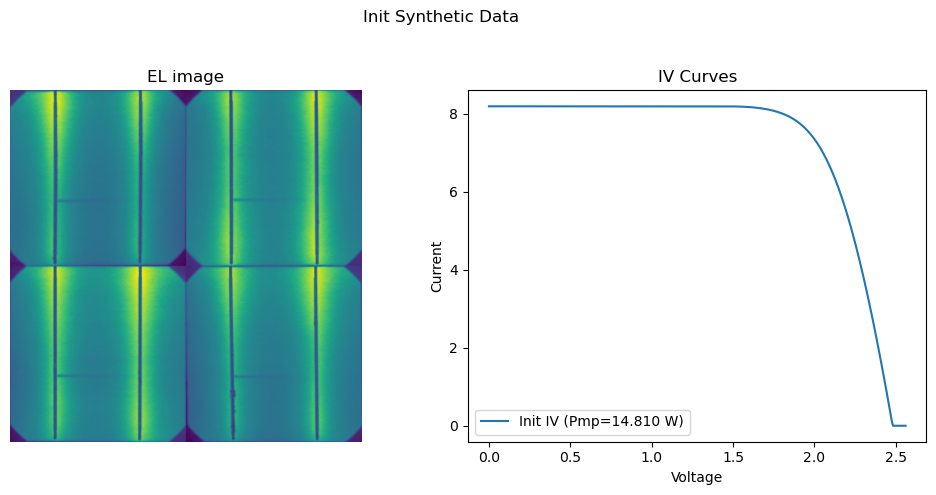

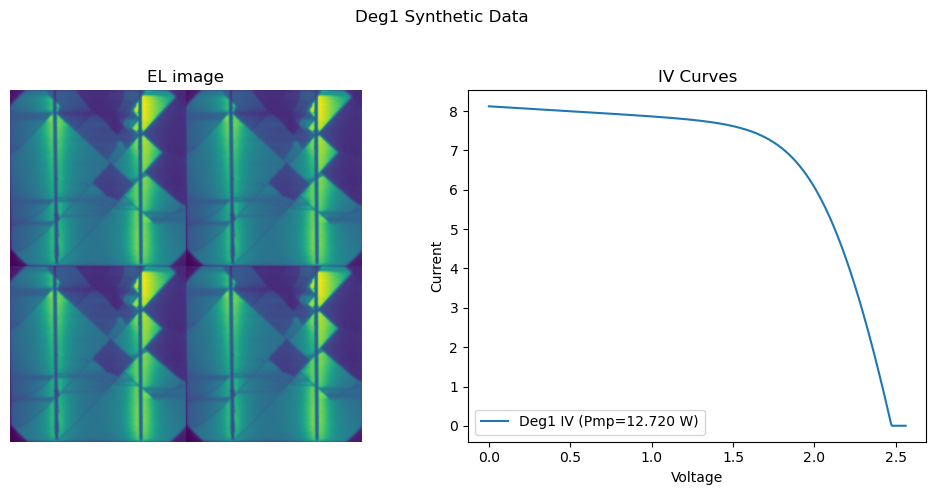

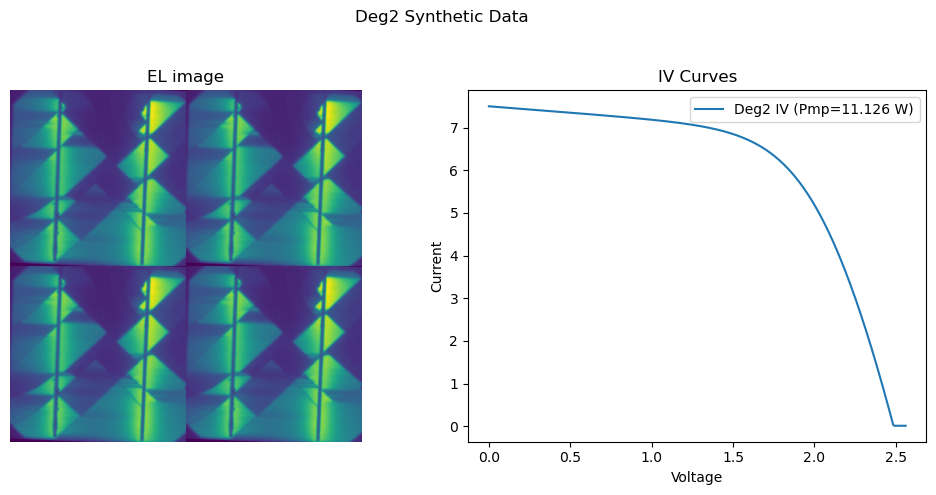

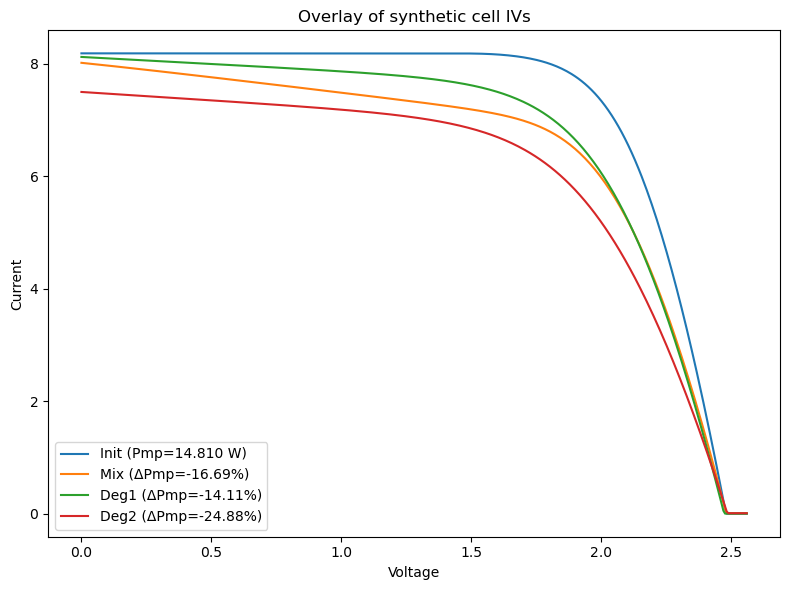

In [ ]:
# File Path for writing Spice files
file_path = f"{os.getcwd()}/pvcracks/pvspice_lite/"
# Voltage over which to simulate
V = np.linspace(0, 0.64 * 4, 400)

# Construct Image for cells into module
MMEL_Mix = cells2Mod(Synth_MiniMod_Mix, (400, 400), 2, 2)
# Order SDM params in the passed DataFrame into a list of dictionary for minimod_spice
Params = extract_params(Synth_MiniMod_Mix)
# Spice simulation for series connected SDM cells
IV_Pred_Mix = minimod_spice(
    Params, file_path, V, V_Step=0.001, file_name="", spicepath=spicepath
)

# Construct Image for cells into module
MMEL_Init = cells2Mod(Synth_MiniMod_Init, (400, 400), 2, 2)
# Order SDM params in the passed DataFrame into a list of dictionary for minimod_spice
Params = extract_params(Synth_MiniMod_Init)
# Spice simulation for series connected SDM cells
IV_Pred_Init = minimod_spice(
    Params, file_path, V, V_Step=0.001, file_name="", spicepath=spicepath
)

# Construct Image for cells into module
MMEL_Deg1 = cells2Mod(Synth_MiniMod_Deg1, (400, 400), 2, 2)
# Order SDM params in the passed DataFrame into a list of dictionary for minimod_spice
Params = extract_params(Synth_MiniMod_Deg1)
# Spice simulation for series connected SDM cells
IV_Pred_Deg1 = minimod_spice(
    Params, file_path, V, V_Step=0.001, file_name="", spicepath=spicepath
)

# Construct Image for cells into module
MMEL_Deg2 = cells2Mod(Synth_MiniMod_Deg2, (400, 400), 2, 2)
# Order SDM params in the passed DataFrame into a list of dictionary for minimod_spice
Params = extract_params(Synth_MiniMod_Deg2)
# Spice simulation for series connected SDM cells
IV_Pred_Deg2 = minimod_spice(
    Params, file_path, V, V_Step=0.001, file_name="", spicepath=spicepath
)


def compute_Pmpp(iv_pred):
    Varr, Iarr = iv_pred
    Parr = Varr * Iarr
    return Parr.max()


# compute all four Pmpp values
Pmp_mix = compute_Pmpp(IV_Pred_Mix)
Pmp_init = compute_Pmpp(IV_Pred_Init)
Pmp_deg1 = compute_Pmpp(IV_Pred_Deg1)
Pmp_deg2 = compute_Pmpp(IV_Pred_Deg2)

# 1×2 figures for each dataset
for MMEL, iv_pred, title, Pmp in [
    (MMEL_Mix, IV_Pred_Mix, "Mix Synthetic Data", Pmp_mix),
    (MMEL_Init, IV_Pred_Init, "Init Synthetic Data", Pmp_init),
    (MMEL_Deg1, IV_Pred_Deg1, "Deg1 Synthetic Data", Pmp_deg1),
    (MMEL_Deg2, IV_Pred_Deg2, "Deg2 Synthetic Data", Pmp_deg2),
]:
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))
    fig.suptitle(title)
    axs[0].imshow(MMEL)
    axs[0].axis("off")
    axs[0].set_title("EL image")

    axs[1].plot(
        iv_pred[0], iv_pred[1], label=f"{title.split()[0]} IV (Pmp={Pmp:.3f} W)"
    )
    axs[1].set_xlabel("Voltage")
    axs[1].set_ylabel("Current")
    axs[1].set_title("IV Curves")
    axs[1].legend()
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# overlay with ΔPmpp relative to Init
plt.figure(figsize=(8, 6))
plt.title("Overlay of synthetic cell IVs")

# plot Init first, with its absolute Pmpp
plt.plot(IV_Pred_Init[0], IV_Pred_Init[1], label=f"Init (Pmp={Pmp_init:.3f} W)")

# plot the others, with ΔPmpp = Pmpp_x – Pmpp_init
for label, iv_pred, Pmp in [
    ("Mix", IV_Pred_Mix, Pmp_mix),
    ("Deg1", IV_Pred_Deg1, Pmp_deg1),
    ("Deg2", IV_Pred_Deg2, Pmp_deg2),
]:
    delta = (Pmp - Pmp_init) / Pmp_init * 100
    plt.plot(iv_pred[0], iv_pred[1], label=f"{label} (ΔPmp={delta:+.2f}%)")

plt.xlabel("Voltage")
plt.ylabel("Current")
plt.legend()
plt.tight_layout()
plt.show()

#### Same but this time for 3x3 modules (like original used for validation)

In [ ]:
# Randomly select 9 init cells and combine them into a single dataframe
Synth_MiniMod_Init = Init_Cells.sample(n=9)
# Select the damaged cell (top left corner) in Deg1 and repeat it 9 times
Synth_MiniMod_Deg1 = Deg1_Cells.loc[[12, 12, 12, 12, 12, 12, 12, 12, 12]]
# Select the damaged cell (top left corner) in Deg2 and repeat it 9 times
Synth_MiniMod_Deg2 = Deg2_Cells.loc[[21, 21, 21, 21, 21, 21, 21, 21, 21]]
# Mix 3 initial cells and the most damaged cell in Deg2
Synth_MiniMod_Mix = pd.concat(
    (Deg2_Cells.loc[[21, 21, 21, 21, 21, 21]], Init_Cells.sample(n=3))
)

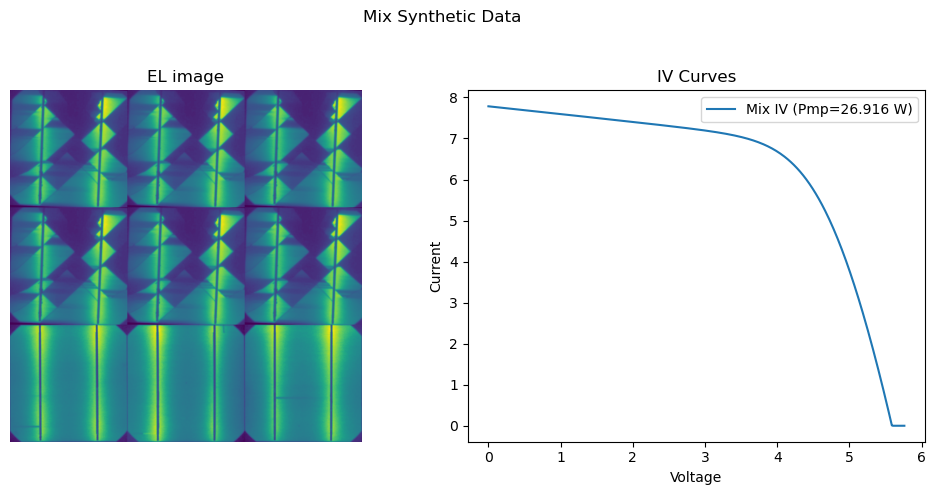

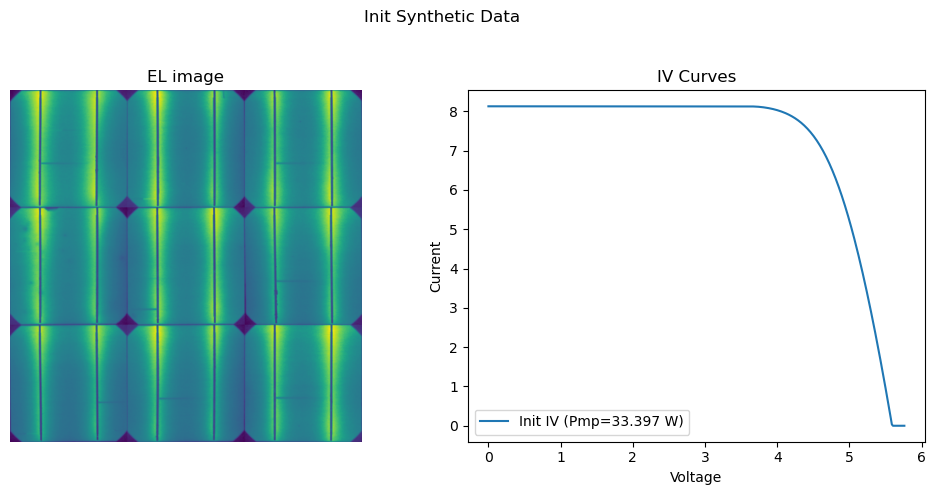

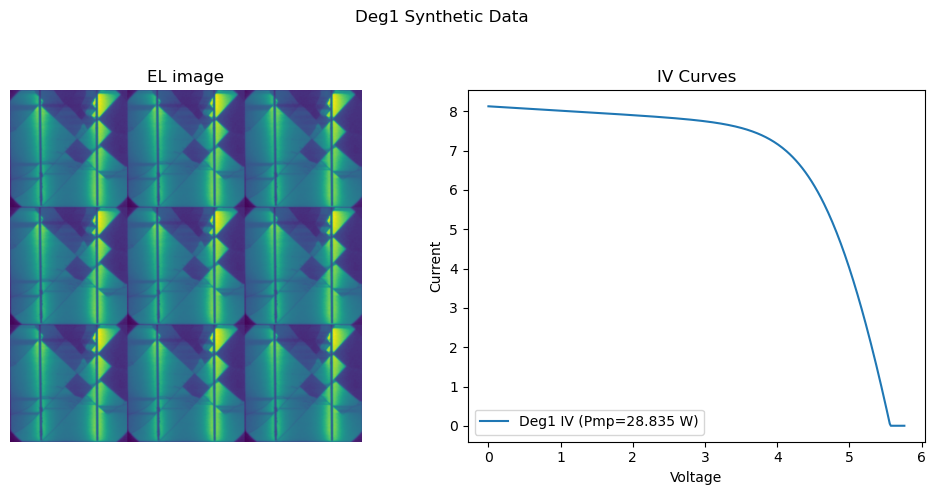

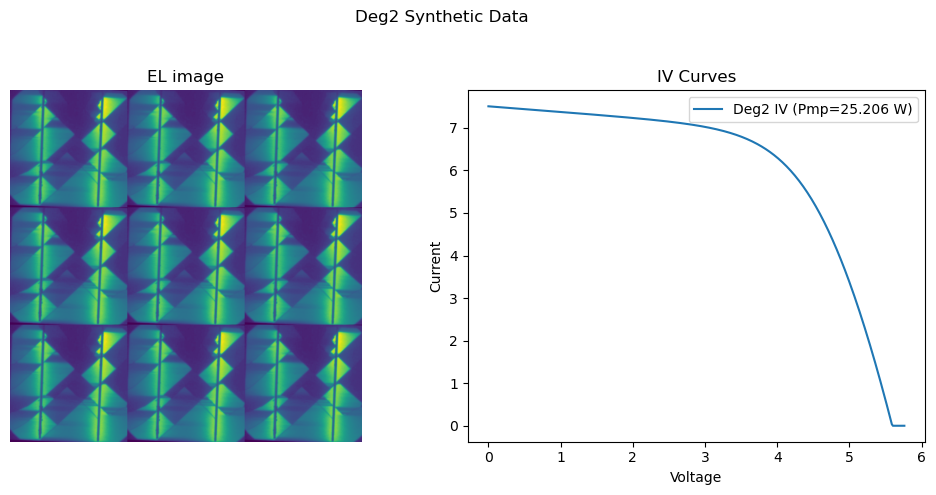

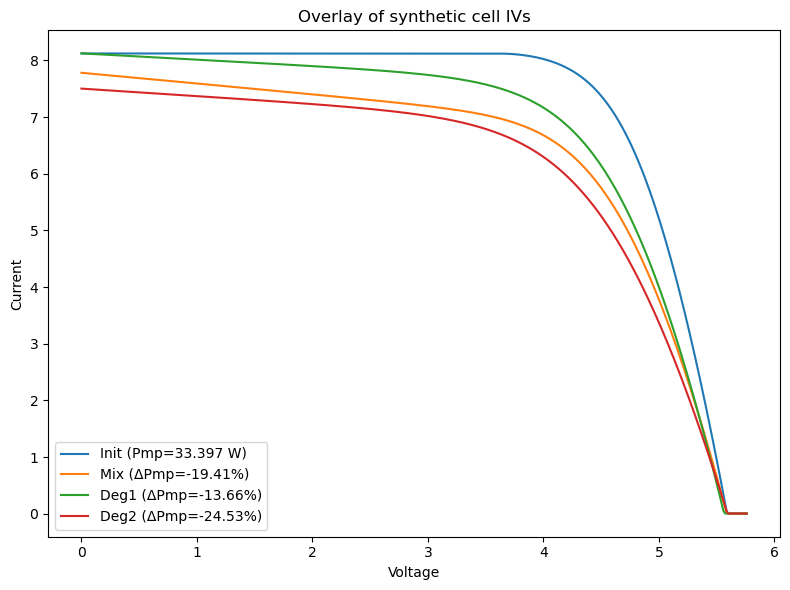

In [ ]:
# File Path for writing Spice files
file_path = f"{os.getcwd()}/pvcracks/pvspice_lite/"
# Voltage over which to simulate
V = np.linspace(0, 0.64 * 9, 400)

# Construct Image for cells into module
MMEL_Mix = cells2Mod(Synth_MiniMod_Mix, (400, 400), 3, 3)
# Order SDM params in the passed DataFrame into a list of dictionary for minimod_spice
Params = extract_params(Synth_MiniMod_Mix)
# Spice simulation for series connected SDM cells
IV_Pred_Mix = minimod_spice(
    Params, file_path, V, V_Step=0.001, file_name="", spicepath=spicepath
)

# Construct Image for cells into module
MMEL_Init = cells2Mod(Synth_MiniMod_Init, (400, 400), 3, 3)
# Order SDM params in the passed DataFrame into a list of dictionary for minimod_spice
Params = extract_params(Synth_MiniMod_Init)
# Spice simulation for series connected SDM cells
IV_Pred_Init = minimod_spice(
    Params, file_path, V, V_Step=0.001, file_name="", spicepath=spicepath
)

# Construct Image for cells into module
MMEL_Deg1 = cells2Mod(Synth_MiniMod_Deg1, (400, 400), 3, 3)
# Order SDM params in the passed DataFrame into a list of dictionary for minimod_spice
Params = extract_params(Synth_MiniMod_Deg1)
# Spice simulation for series connected SDM cells
IV_Pred_Deg1 = minimod_spice(
    Params, file_path, V, V_Step=0.001, file_name="", spicepath=spicepath
)

# Construct Image for cells into module
MMEL_Deg2 = cells2Mod(Synth_MiniMod_Deg2, (400, 400), 3, 3)
# Order SDM params in the passed DataFrame into a list of dictionary for minimod_spice
Params = extract_params(Synth_MiniMod_Deg2)
# Spice simulation for series connected SDM cells
IV_Pred_Deg2 = minimod_spice(
    Params, file_path, V, V_Step=0.001, file_name="", spicepath=spicepath
)


def compute_Pmpp(iv_pred):
    Varr, Iarr = iv_pred
    Parr = Varr * Iarr
    return Parr.max()


# compute all four Pmpp values
Pmp_mix = compute_Pmpp(IV_Pred_Mix)
Pmp_init = compute_Pmpp(IV_Pred_Init)
Pmp_deg1 = compute_Pmpp(IV_Pred_Deg1)
Pmp_deg2 = compute_Pmpp(IV_Pred_Deg2)

# 1×2 figures for each dataset
for MMEL, iv_pred, title, Pmp in [
    (MMEL_Mix, IV_Pred_Mix, "Mix Synthetic Data", Pmp_mix),
    (MMEL_Init, IV_Pred_Init, "Init Synthetic Data", Pmp_init),
    (MMEL_Deg1, IV_Pred_Deg1, "Deg1 Synthetic Data", Pmp_deg1),
    (MMEL_Deg2, IV_Pred_Deg2, "Deg2 Synthetic Data", Pmp_deg2),
]:
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))
    fig.suptitle(title)
    axs[0].imshow(MMEL)
    axs[0].axis("off")
    axs[0].set_title("EL image")

    axs[1].plot(
        iv_pred[0], iv_pred[1], label=f"{title.split()[0]} IV (Pmp={Pmp:.3f} W)"
    )
    axs[1].set_xlabel("Voltage")
    axs[1].set_ylabel("Current")
    axs[1].set_title("IV Curves")
    axs[1].legend()
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# overlay with ΔPmpp relative to Init
plt.figure(figsize=(8, 6))
plt.title("Overlay of synthetic cell IVs")

# plot Init first, with its absolute Pmpp
plt.plot(IV_Pred_Init[0], IV_Pred_Init[1], label=f"Init (Pmp={Pmp_init:.3f} W)")

# plot the others, with ΔPmpp = Pmpp_x – Pmpp_init
for label, iv_pred, Pmp in [
    ("Mix", IV_Pred_Mix, Pmp_mix),
    ("Deg1", IV_Pred_Deg1, Pmp_deg1),
    ("Deg2", IV_Pred_Deg2, Pmp_deg2),
]:
    delta = (Pmp - Pmp_init) / Pmp_init * 100
    plt.plot(iv_pred[0], iv_pred[1], label=f"{label} (ΔPmp={delta:+.2f}%)")

plt.xlabel("Voltage")
plt.ylabel("Current")
plt.legend()
plt.tight_layout()
plt.show()